#### This notebook compares the CESM 0.1º and 1º O$_2$ distributions and zonal velcoity fields to observations

---
### Import packages

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
import warnings
warnings.simplefilter("ignore") # Silence warnings

import xarray as xr
import numpy as np

import pop_tools 
from pop_tools import get_grid

from tqdm import tqdm
import bokeh

import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.ticker as mticker
import matplotlib.patches as patches
import cartopy
import cartopy.crs as ccrs
from cartopy import util
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import cmocean
import proplot

from utils import *


---
## Spin up Dask Cluster/Client

In [2]:
C=CLSTR(3,30,109,10)

In [1]:
C

## Read 0.1º CESM Outputs

In [4]:
path = f'/glade/scratch/yeddebba/Mesoscale/HR/CLM/'
file = f'{path}/*TPAC_CLM.nc'
dsu = xr.open_mfdataset(file, decode_times=False, decode_coords=False, data_vars=['UVEL','VVEL','O2','ULAT','ULONG','TLAT','TLONG','z_t'])
dsu

path = f'/glade/scratch/yeddebba/Mesoscale/LR/CLM/'
file = f'{path}/*.CLM.nc'
dsl = xr.open_mfdataset(file, decode_times=False, decode_coords=False, data_vars=['UVEL','VVEL','O2','ULAT','ULONG','TLAT','TLONG','z_t'])
dsl

# path = f'/glade/scratch/yeddebba/TPOSE/'
# file = f'{path}/tpose_[UV]VEL_monthly_2010to2017.nc'
# dst = xr.open_mfdataset(file, decode_times=False, decode_coords=False)
# dst

path = f'/glade/work/yeddebba/BTPOSE/www.ecco.ucsd.edu/DATA/TROPAC/bgc'
file = f'{path}/tpose_201[01234567]_[UV]VEL.nc'
dst = xr.open_mfdataset(file, decode_times=False, decode_coords=False)
dst

path = f'/glade/work/yeddebba/BTPOSE/www.ecco.ucsd.edu/DATA/TROPAC/bgc'
file = f'{path}/tpose_201[01234567]_O2.nc'
dsto = xr.open_mfdataset(file, decode_times=False, decode_coords=False)
dsto

path = f'/glade/work/yeddebba/drifter/drifter_annualmeans.nc'
dd = xr.open_mfdataset({path})
dd

path='/glade/scratch/yeddebba/Mesoscale/OBS/johnson_velocities.cdf'
dj = xr.open_dataset(path, decode_times=False, decode_coords=False)
dj

# Unit Conversion
umol_kg_mmol_m3=1*1.027
ml_l_mmol_m3=44.4

# WOA O2 data from https://www.nodc.noaa.gov/OC5/indprod.html: 
path='/glade/scratch/yeddebba/Mesoscale/OBS'
file = f'{path}/WOA2018_O2_clm.nc'
dsw = xr.open_dataset(file, decode_times=False, decode_coords=False)
varname=['o_an','lat','lon','depth'] 
dsw=dsw.drop([v for v in dsw.variables if v not in varname])
dsw=dsw*umol_kg_mmol_m3
dsw

# Using CARS CSIRO Atlas from: http://www.marine.csiro.au/~dunn/cars2009/ 
path='/glade/scratch/yeddebba/Mesoscale/OBS'  
file = f'{path}/oxygen_cars2009.nc'
dsc = xr.open_dataset(file, decode_times=False, decode_coords=False)
varname=['o2','lat','lon','depth'] 
dsc=dsc.drop([v for v in dsc.variables if v not in varname])  
dsc=dsc*ml_l_mmol_m3
dsc

In [6]:
dst

<xarray.Dataset>
Dimensions:    (XC: 1128, XG: 1128, YC: 240, YG: 240, Z: 51, time: 96)
Coordinates:
  * XG         (XG) float32 104.0 104.2 104.3 104.5 ... 291.3 291.5 291.7 291.8
  * YC         (YC) float32 -19.92 -19.75 -19.58 -19.42 ... 19.58 19.75 19.92
  * Z          (Z) float32 -2.5 -7.5 -12.5 ... -4.725e+03 -5.235e+03 -5.745e+03
  * time       (time) int64 191844000 194472000 ... 438876000 441504000
  * XC         (XC) float32 104.1 104.2 104.4 104.6 ... 291.4 291.6 291.8 291.9
  * YG         (YG) float32 -20.0 -19.83 -19.67 -19.5 ... 19.33 19.5 19.67 19.83
Data variables: (12/19)
    dyG        (time, YC, XG) float32 dask.array<chunksize=(12, 240, 1128), meta=np.ndarray>
    dxC        (time, YC, XG) float32 dask.array<chunksize=(12, 240, 1128), meta=np.ndarray>
    rAw        (time, YC, XG) float32 dask.array<chunksize=(12, 240, 1128), meta=np.ndarray>
    maskInW    (time, YC, XG) bool dask.array<chunksize=(12, 240, 1128), meta=np.ndarray>
    hFacW      (time, Z, YC, XG) float32 dask.array<chunksize=(12, 51, 240, 1128), meta=np.ndarray>
    maskW      (time, Z, YC, XG) bool dask.array<chunksize=(12, 51, 240, 1128), meta=np.ndarray>
    ...         ...
    rAs        (time, YG, XC) float32 dask.array<chunksize=(12, 240, 1128), meta=np.ndarray>
    maskInS    (time, YG, XC) bool dask.array<chunksize=(12, 240, 1128), meta=np.ndarray>
    hFacS      (time, Z, YG, XC) float32 dask.array<chunksize=(12, 51, 240, 1128), meta=np.ndarray>
    maskS      (time, Z, YG, XC) bool dask.array<chunksize=(12, 51, 240, 1128), meta=np.ndarray>
    maskCtrlS  (time, Z, YG, XC) bool dask.array<chunksize=(12, 51, 240, 1128), meta=np.ndarray>
    VVEL       (time, Z, YG, XC) float32 dask.array<chunksize=(12, 51, 240, 1128), meta=np.ndarray>

### Pick longitude Index to plot 

In [8]:
lon_ind=[110.0, 125.0, 140]
lon_w=lon_ind[1]

lat_eq=0.0
latu_i,lonu_i=find_indices(dsu.TLONG,dsu.TLAT,360-lon_w,lat_eq)
latl_i,lonl_i=find_indices(dsl.TLONG,dsl.TLAT,360-lon_w,lat_eq)
lon_joh=360.00-lon_w
lon_cars=360.00-lon_w     
z=dsu.z_t*1e-2
zl=dsl.z_t*1e-2
zj=dj.ZDEP1_50
# zt=dst.depth*(-1)
zto=dst.Z*(-1)
zto=dsto.Z*(-1)
latu=dsu.ULAT[:,lonu_i]
latl=dsl.ULAT[:,lonl_i]
latj=dj.YLAT11_101
# latt=dst.lat
latt=dst.YC
latto=dsto.YC

# U_h=dsu.UVEL.isel(nlon=lonu_i)
# U_l=dsl.UVEL.isel(nlon=lonl_i)
# U_j=dj.UM.sel(XLON=lon_joh,method='nearest')*100
# U_t=dst.UVEL.where(dst.lon==360-lon_w+0.5,drop=True).compute()
# U_d=(dd.U.where(dd.Lon==-lon_w+0.375,drop=True).squeeze()).compute()

# # O2_h=dsu.O2.isel(nlon=lonu_i)
# # O2_l=dsl.O2.isel(nlon=lonl_i)
# # O2_t=dsto.TRAC03.sel(XC=360-lon_w,method='nearest').mean('time').compute()



100%|██████████| 3/3 [00:04<00:00,  1.51s/it]


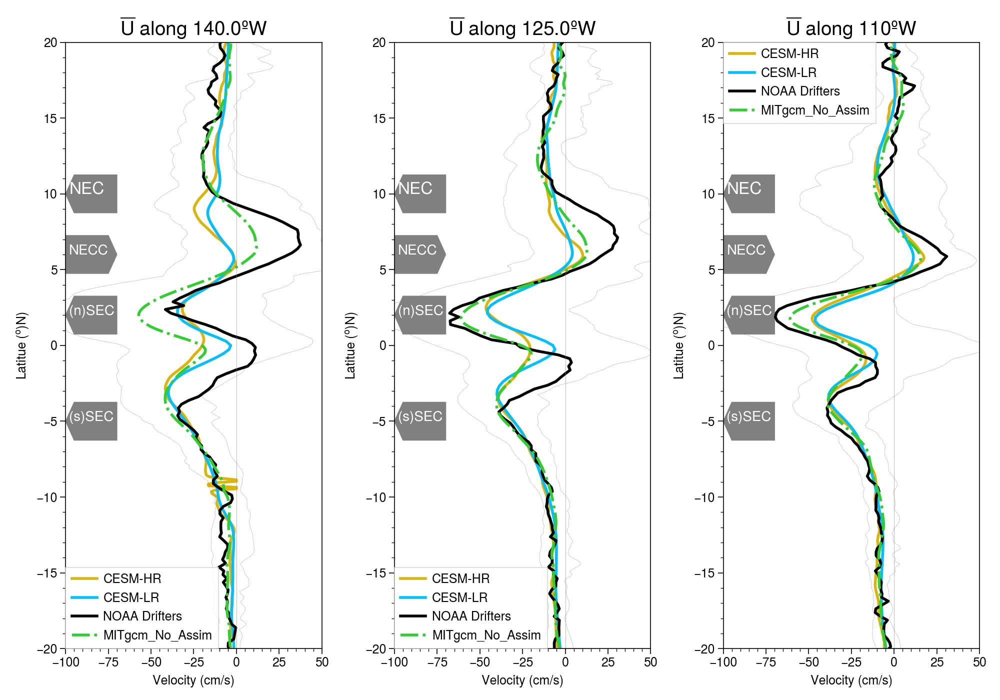

In [12]:
lon_ind=[140.0, 125.0, 110]
fig=plt.figure(figsize=(10,7),facecolor='white')

for jj in tqdm([0,1,2]):
    lon_w=lon_ind[jj]
    lat_eq=0.0
    latu_i,lonu_i=find_indices(dsu.TLONG,dsu.TLAT,360-lon_w,lat_eq)
    latl_i,lonl_i=find_indices(dsl.TLONG,dsl.TLAT,360-lon_w,lat_eq)
    lon_joh=360.00-lon_w
    U_h=dsu.UVEL.isel(nlon=lonu_i)
    U_l=dsl.UVEL.isel(nlon=lonl_i)
    U_j=dj.UM.sel(XLON=lon_joh,method='nearest')*100
    U_t=dst.UVEL.where(dst.XG==360-lon_w+0.5,drop=True).compute()
    U_d=(dd.U.where(dd.Lon==-lon_w+0.375,drop=True).squeeze()).compute()
    ax=fig.add_subplot(1, 3,jj+1)

    ax.plot(U_h.isel(z_t=0).squeeze(),dsu.ULAT[:,0],color='gold',label='CESM-HR',lw=2,)
    plt.plot(U_l.isel(z_t=0).squeeze(),dsl.ULAT[:,0],color='deepskyblue',label='CESM-LR',lw=2,)
    plt.plot(U_d*100,dd.Lat,color='black',Linewidth=2,label='NOAA Drifters')
    plt.plot(U_t.mean('time').isel(Z=0).squeeze()*100,dst.YC,color='limegreen',lw=2,linestyle='-.',label='MITgcm_No_Assim')
    plt.plot(U_t.isel(Z=0).max('time').squeeze()*100,dst.YC,color='grey',lw=0.2,linestyle='--')
    plt.plot(U_t.isel(Z=0).min('time').squeeze()*100,dst.YC,color='grey',lw=0.2,linestyle='--')
    plt.ylim(-20,20)
    plt.xlim(-100,50)
    plt.axvline(x=0,lw=0.2,color='grey')
    plt.title('$\overline{U}$ along '+str(lon_w)+'ºW',fontsize=14)
    plt.legend()
    plt.grid(b=None)
    plt.ylabel('Latitue ($^o$)N)')
    plt.xlabel('Velocity (cm/s)')

    plt.text(-98,10,'NEC',color='white',fontsize=12)
    plt.arrow(-70, 10, -30 , 0, length_includes_head=True, width=2.5, head_width=2.5, head_length=5,color='grey')
    plt.text(-98,6,'NECC',color='white',fontsize=10)
    plt.arrow(-100, 6, 30 , 0, length_includes_head=True, width=2.5, head_width=2.5, head_length=5,color='grey')
    plt.text(-98,2,'(n)SEC',color='white',fontsize=10)
    plt.arrow(-70, 2, -30 , 0, length_includes_head=True, width=2.5, head_width=2.5, head_length=5,color='grey')
    plt.text(-98,-5,'(s)SEC',color='white',fontsize=10)
    plt.arrow(-70, -5, -30 , 0, length_includes_head=True, width=2.5, head_width=2.5, head_length=5,color='grey')

fig.tight_layout()    

100%|██████████| 3/3 [00:22<00:00,  7.54s/it]


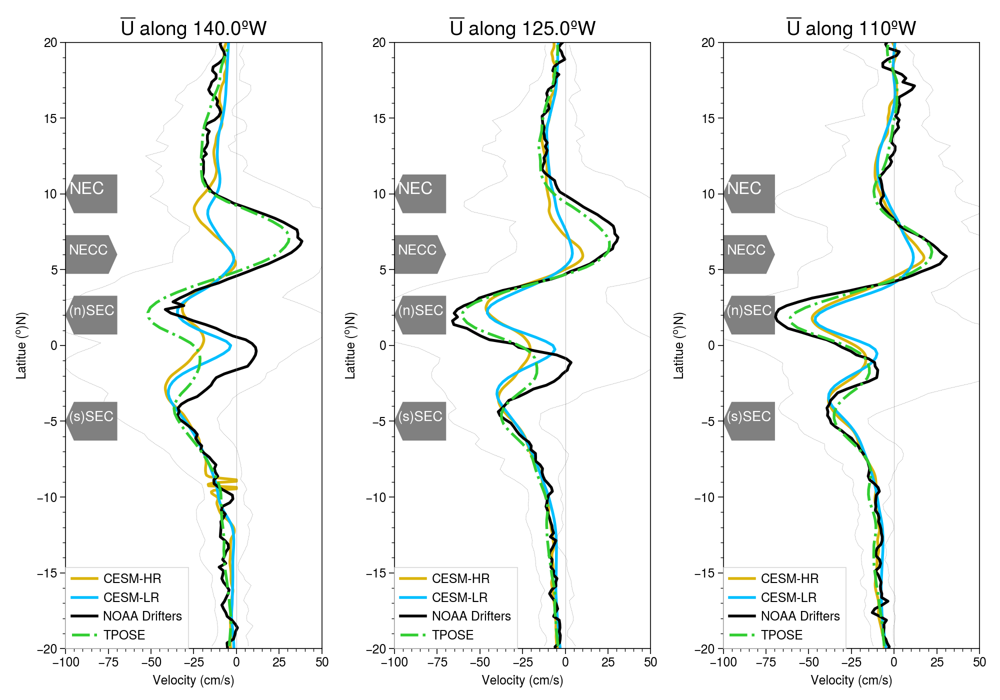

In [147]:
lon_ind=[140.0, 125.0, 110]
fig=plt.figure(figsize=(10,7),facecolor='white')

for jj in tqdm([0,1,2]):
    lon_w=lon_ind[jj]
    lat_eq=0.0
    latu_i,lonu_i=find_indices(dsu.TLONG,dsu.TLAT,360-lon_w,lat_eq)
    latl_i,lonl_i=find_indices(dsl.TLONG,dsl.TLAT,360-lon_w,lat_eq)
    lon_joh=360.00-lon_w
    U_h=dsu.UVEL.isel(nlon=lonu_i)
    U_l=dsl.UVEL.isel(nlon=lonl_i)
    U_j=dj.UM.sel(XLON=lon_joh,method='nearest')*100
    U_t=dst.UVEL.where(dst.lon==360-lon_w+0.5,drop=True).compute()
    U_d=(dd.U.where(dd.Lon==-lon_w+0.375,drop=True).squeeze()).compute()
    ax=fig.add_subplot(1, 3,jj+1)

    ax.plot(U_h.isel(z_t=0).squeeze(),dsu.ULAT[:,0],color='gold',label='CESM-HR',lw=2,)
    plt.plot(U_l.isel(z_t=0).squeeze(),dsl.ULAT[:,0],color='deepskyblue',label='CESM-LR',lw=2,)
    plt.plot(U_d*100,dd.Lat,color='black',Linewidth=2,label='NOAA Drifters')
    plt.plot(U_t.mean('iTIME').isel(iDEPTH=0).squeeze()*100,dst.lat,color='limegreen',lw=2,linestyle='-.',label='TPOSE')
    plt.plot(U_t.isel(iDEPTH=0).max('iTIME').squeeze()*100,dst.lat,color='grey',lw=0.2,linestyle='--')
    plt.plot(U_t.isel(iDEPTH=0).min('iTIME').squeeze()*100,dst.lat,color='grey',lw=0.2,linestyle='--')
    plt.ylim(-20,20)
    plt.xlim(-100,50)
    plt.axvline(x=0,lw=0.2,color='grey')
    plt.title('$\overline{U}$ along '+str(lon_w)+'ºW',fontsize=14)
    plt.legend()
    plt.grid(b=None)
    plt.ylabel('Latitue ($^o$)N)')
    plt.xlabel('Velocity (cm/s)')

    plt.text(-98,10,'NEC',color='white',fontsize=12)
    plt.arrow(-70, 10, -30 , 0, length_includes_head=True, width=2.5, head_width=2.5, head_length=5,color='grey')
    plt.text(-98,6,'NECC',color='white',fontsize=10)
    plt.arrow(-100, 6, 30 , 0, length_includes_head=True, width=2.5, head_width=2.5, head_length=5,color='grey')
    plt.text(-98,2,'(n)SEC',color='white',fontsize=10)
    plt.arrow(-70, 2, -30 , 0, length_includes_head=True, width=2.5, head_width=2.5, head_length=5,color='grey')
    plt.text(-98,-5,'(s)SEC',color='white',fontsize=10)
    plt.arrow(-70, -5, -30 , 0, length_includes_head=True, width=2.5, head_width=2.5, head_length=5,color='grey')

fig.tight_layout()    

In [150]:
savefig(fig,'Supp_Figures/Supp_Figure_1')

# Add Depth with TAO at same Longitudes

100%|██████████| 3/3 [00:09<00:00,  3.13s/it]


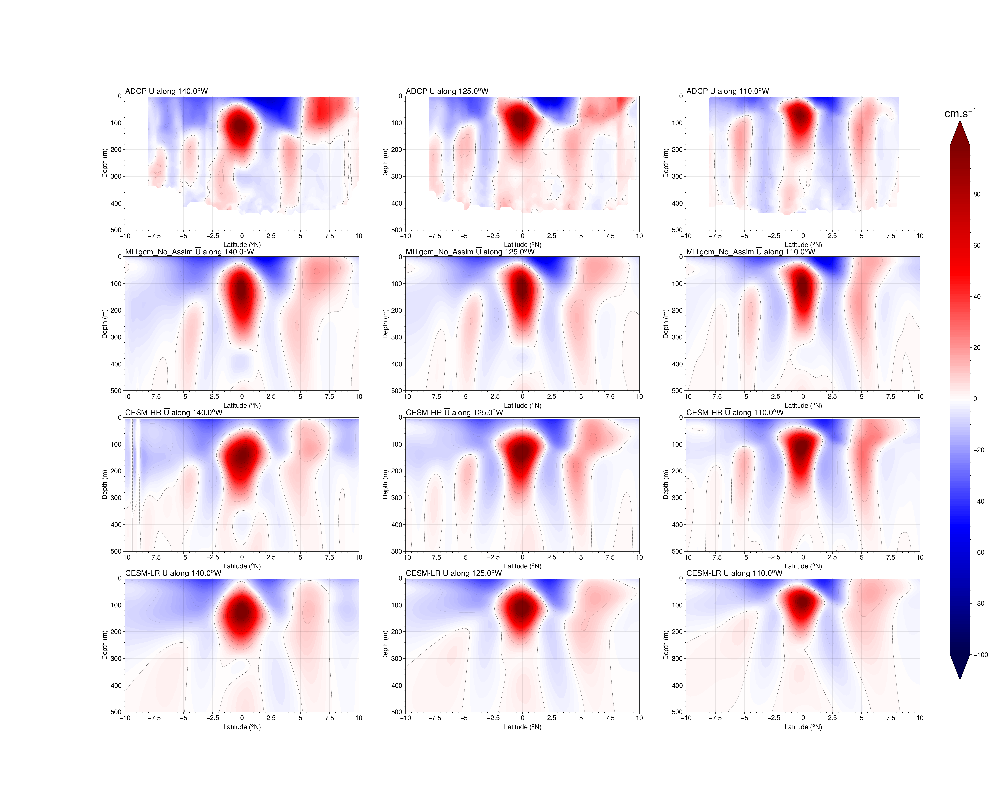

In [14]:
fig=plt.figure(figsize=(25,20),facecolor='white')
unlevels=np.arange(-100,100,1); unlevels0=np.arange(-0.01,0.01,1);unlevels1=np.arange(-100,100,10);
fs=12; fst = 14
lon_ind=[140.0, 125.0, 110.0]

for j in tqdm(np.arange(0,3)):
    lon_w=lon_ind[j]
    lat_eq=0.0
    latu_i,lonu_i=find_indices(dsu.TLONG,dsu.TLAT,360-lon_w,lat_eq)
    latl_i,lonl_i=find_indices(dsl.TLONG,dsl.TLAT,360-lon_w,lat_eq)
    lon_joh=360.00-lon_w
    lon_cars=360.00-lon_w     
    z=dsu.z_t*1e-2
    zl=dsl.z_t*1e-2
    zj=dj.ZDEP1_50
#     zt=dst.depth*(-1)
    zt=dsto.Z*(-1)
    zto=dsto.Z*(-1)
    latu=dsu.ULAT[:,lonu_i]
    latl=dsl.ULAT[:,lonl_i]
    latj=dj.YLAT11_101
#     latt=dst.lat
    latt=dsto.YC
    latto=dsto.YC

    U_h=dsu.UVEL.isel(nlon=lonu_i)
    U_l=dsl.UVEL.isel(nlon=lonl_i)
    U_j=dj.UM.sel(XLON=lon_joh,method='nearest')*100
    U_t=dst.UVEL.where(dst.XG==360-lon_w+0.5,drop=True).mean('time').compute()*100
    U_d=(dd.U.where(dd.Lon==-lon_w+0.375,drop=True).squeeze()).compute()

    varp=[U_j,U_t,U_h,U_l]
    latp=[latj,latt,latu,latl]
    zp=[zj,zt,z,zl]
    titlep=['ADCP','MITgcm_No_Assim','CESM-HR','CESM-LR']

    for k in tqdm(np.arange(0,4)):
        ax2 = plt.subplot(4,3,1+k*3+j)
        cs= ax2.contourf(latp[k],zp[k],varp[k].squeeze(),cmap='seismic',linewidths=0.1,levels=unlevels,extend='both')
        cs0= ax2.contour(latp[k], zp[k],varp[k].squeeze(), colors='black', linewidths=0.05, levels=unlevels1)
        cs0= ax2.contour(latp[k], zp[k],varp[k].squeeze(), colors='black', linewidths=0.2, levels=unlevels0)
        ax2.set_ylim([500., 0.])
        ax2.set_xlim([-10, 10])
        ax2.minorticks_on()
        ax2.set_ylabel('Depth (m)',fontsize=fs)
        ax2.set_title( titlep[k]+' $\overline{U}$ along ' +str(np.round(lon_w,2))+'$^o$W',pad=0.01,fontsize=fst, loc='left');
        ax2.tick_params(axis='both', labelsize=fs)
#         plt.text(-0.5, 100, 'EUC', {'color': 'cyan', 'fontsize': fs})
#         plt.text(-5, 50, 'SEC', {'color': 'cyan', 'fontsize': fs})
#         plt.text(2, 50, 'SEC', {'color': 'cyan', 'fontsize': fs})
#         plt.text(-6, 200+10, 'SSCC', {'color': 'cyan', 'fontsize': fs})
#         plt.text(3.5, 200+10, 'NSCC', {'color': 'cyan', 'fontsize': fs})
#         plt.text(5, 50, 'NECC', {'color': 'cyan', 'fontsize': fs})
#         plt.text(9, 50, 'NEC', {'color': 'cyan', 'fontsize': fs})
        ax2.set_xlabel('Latitude ($^o$N)', fontsize=fs)
        ax2.xaxis.set_ticks_position('bottom')

# fig.subplots_adjust(right=0.84)
# cbar_ax = fig.add_axes([0.86, 0.15, 0.02, 0.7])
fig.subplots_adjust(right=0.92)
cbar_ax = fig.add_axes([0.95, 0.15, 0.02, 0.7])
cbar = fig.colorbar(cs, cax=cbar_ax,)
cbar.ax.set_title('cm.s$^{-1}$',fontsize=20);
cbar.ax.tick_params(labelsize=12)

100%|██████████| 3/3 [00:21<00:00,  7.19s/it]


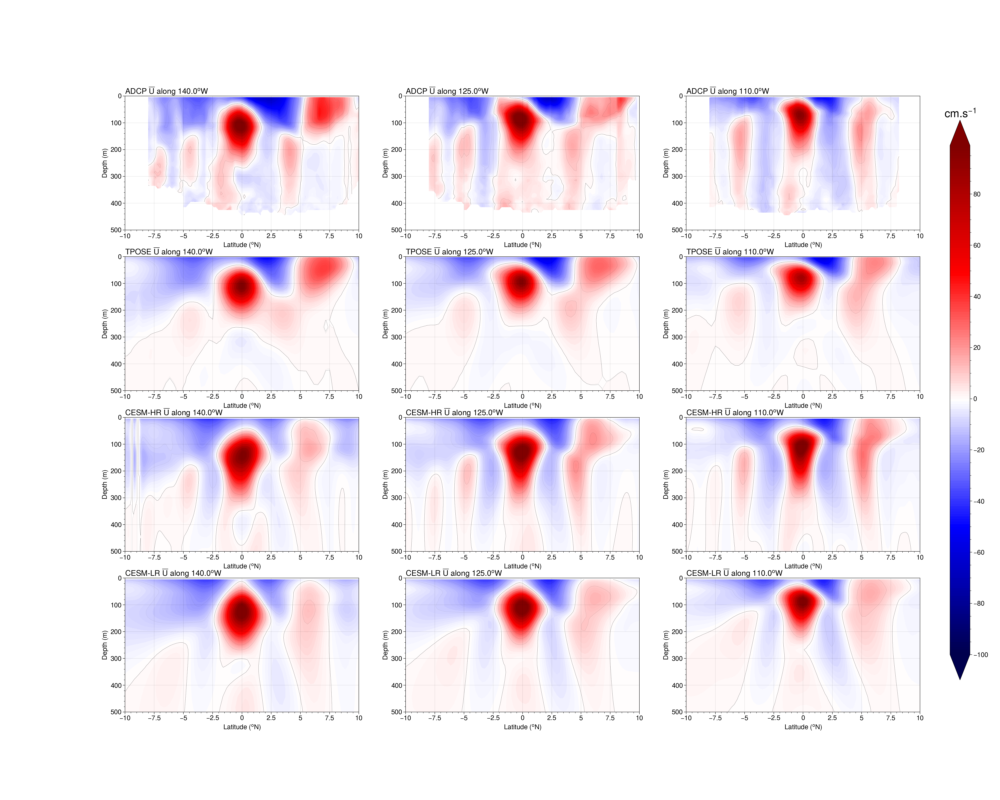

In [158]:
fig=plt.figure(figsize=(25,20),facecolor='white')
unlevels=np.arange(-100,100,1); unlevels0=np.arange(-0.01,0.01,1);unlevels1=np.arange(-100,100,10);
fs=12; fst = 14
lon_ind=[140.0, 125.0, 110.0]

for j in tqdm(np.arange(0,3)):
    lon_w=lon_ind[j]
    lat_eq=0.0
    latu_i,lonu_i=find_indices(dsu.TLONG,dsu.TLAT,360-lon_w,lat_eq)
    latl_i,lonl_i=find_indices(dsl.TLONG,dsl.TLAT,360-lon_w,lat_eq)
    lon_joh=360.00-lon_w
    lon_cars=360.00-lon_w     
    z=dsu.z_t*1e-2
    zl=dsl.z_t*1e-2
    zj=dj.ZDEP1_50
    zt=dst.depth*(-1)
    zto=dsto.Z*(-1)
    latu=dsu.ULAT[:,lonu_i]
    latl=dsl.ULAT[:,lonl_i]
    latj=dj.YLAT11_101
    latt=dst.lat
    latto=dsto.YC

    U_h=dsu.UVEL.isel(nlon=lonu_i)
    U_l=dsl.UVEL.isel(nlon=lonl_i)
    U_j=dj.UM.sel(XLON=lon_joh,method='nearest')*100
    U_t=dst.UVEL.where(dst.lon==360-lon_w+0.5,drop=True).mean('iTIME').compute()*100
    U_d=(dd.U.where(dd.Lon==-lon_w+0.375,drop=True).squeeze()).compute()

    varp=[U_j,U_t,U_h,U_l]
    latp=[latj,latt,latu,latl]
    zp=[zj,zt,z,zl]
    titlep=['ADCP','TPOSE','CESM-HR','CESM-LR']

    for k in tqdm(np.arange(0,4)):
        ax2 = plt.subplot(4,3,1+k*3+j)
        cs= ax2.contourf(latp[k],zp[k],varp[k].squeeze(),cmap='seismic',linewidths=0.1,levels=unlevels,extend='both')
        cs0= ax2.contour(latp[k], zp[k],varp[k].squeeze(), colors='black', linewidths=0.05, levels=unlevels1)
        cs0= ax2.contour(latp[k], zp[k],varp[k].squeeze(), colors='black', linewidths=0.2, levels=unlevels0)
        ax2.set_ylim([500., 0.])
        ax2.set_xlim([-10, 10])
        ax2.minorticks_on()
        ax2.set_ylabel('Depth (m)',fontsize=fs)
        ax2.set_title( titlep[k]+' $\overline{U}$ along ' +str(np.round(lon_w,2))+'$^o$W',pad=0.01,fontsize=fst, loc='left');
        ax2.tick_params(axis='both', labelsize=fs)
#         plt.text(-0.5, 100, 'EUC', {'color': 'cyan', 'fontsize': fs})
#         plt.text(-5, 50, 'SEC', {'color': 'cyan', 'fontsize': fs})
#         plt.text(2, 50, 'SEC', {'color': 'cyan', 'fontsize': fs})
#         plt.text(-6, 200+10, 'SSCC', {'color': 'cyan', 'fontsize': fs})
#         plt.text(3.5, 200+10, 'NSCC', {'color': 'cyan', 'fontsize': fs})
#         plt.text(5, 50, 'NECC', {'color': 'cyan', 'fontsize': fs})
#         plt.text(9, 50, 'NEC', {'color': 'cyan', 'fontsize': fs})
        ax2.set_xlabel('Latitude ($^o$N)', fontsize=fs)
        ax2.xaxis.set_ticks_position('bottom')

# fig.subplots_adjust(right=0.84)
# cbar_ax = fig.add_axes([0.86, 0.15, 0.02, 0.7])
fig.subplots_adjust(right=0.92)
cbar_ax = fig.add_axes([0.95, 0.15, 0.02, 0.7])
cbar = fig.colorbar(cs, cax=cbar_ax,)
cbar.ax.set_title('cm.s$^{-1}$',fontsize=20);
cbar.ax.tick_params(labelsize=12)

In [159]:
savefig(fig,'Supp_Figures/Supp_Figure_2')

100%|██████████| 3/3 [00:04<00:00,  1.62s/it]


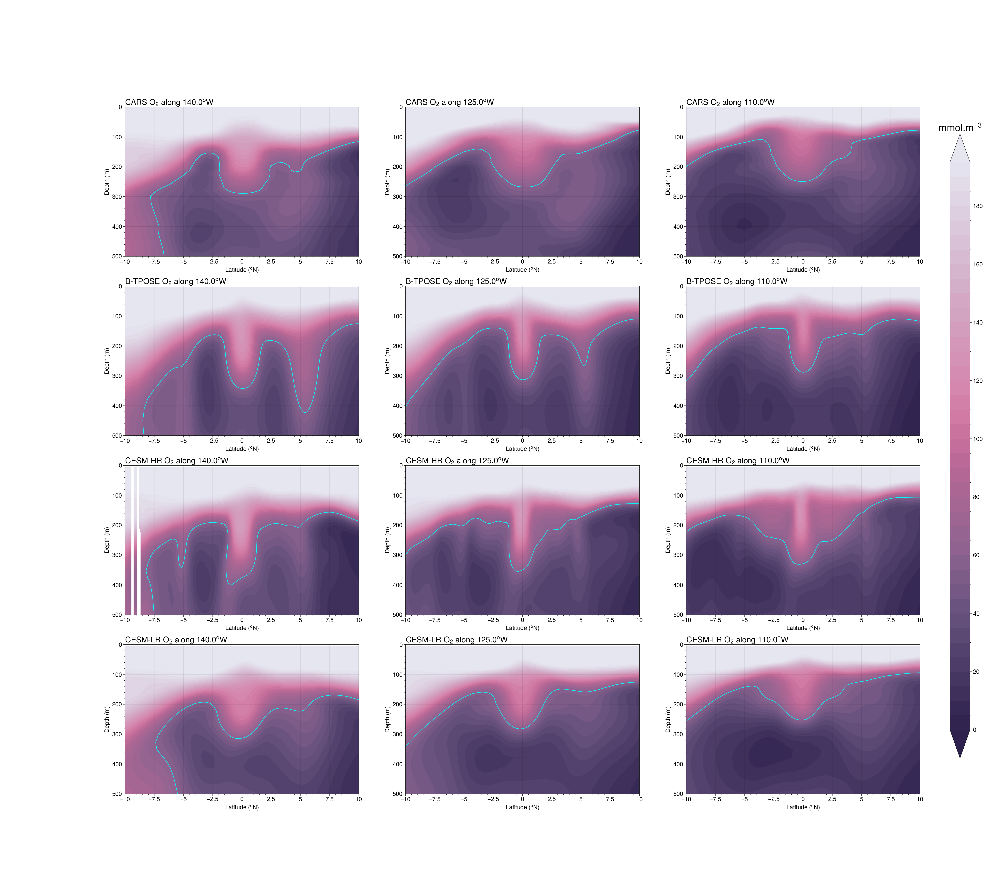

In [160]:
fig=plt.figure(figsize=(28,25),dpi=100,facecolor='white')
unlevels=np.arange(0,200,5); unlevels0=np.arange(60.00,60.01,1)
fs=12; fst = 12
lon_ind=[140.0, 125.0, 110.0]

for j in tqdm(np.arange(0,3)):
    lon_w=lon_ind[j]
    lat_eq=0.0
    latu_i,lonu_i=find_indices(dsu.TLONG,dsu.TLAT,360-lon_w,lat_eq)
    latl_i,lonl_i=find_indices(dsl.TLONG,dsl.TLAT,360-lon_w,lat_eq)
    lon_joh=360.00-lon_w
    lon_cars=360.00-lon_w     
    z=dsu.z_t*1e-2
    zl=dsl.z_t*1e-2
    zj=dj.ZDEP1_50
    zt=dst.depth*(-1)
    zto=dsto.Z*(-1)
    zc=dsc.depth
    latu=dsu.ULAT[:,lonu_i]
    latl=dsl.ULAT[:,lonl_i]
    latj=dj.YLAT11_101
    latt=dst.lat
    latto=dsto.YC
    latc=dsc.lat

    O2_c=dsc.o2.sel(lon=lon_cars,method='nearest')
    O2_h=dsu.O2.isel(nlon=lonu_i)
    O2_l=dsl.O2.isel(nlon=lonl_i)
    O2_t=dsto.TRAC03.sel(XC=360-lon_w,method='nearest').mean('time').compute()*1e3

    varp=[O2_c,O2_t,O2_h,O2_l]
    latp=[latc,latto,latu,latl]
    zp=[zc,zt,z,zl]
    titlep=['CARS','B-TPOSE','CESM-HR','CESM-LR']

    for k in tqdm(np.arange(0,4)):
        ax2 = plt.subplot(4,3,1+k*3+j)
        cs= ax2.contourf(latp[k],zp[k],varp[k].squeeze(),cmap='acton',linewidths=0.1,levels=unlevels,extend='both')
        cs0= ax2.contour(latp[k], zp[k],varp[k].squeeze(), colors='cyan', linewidths=1, levels=unlevels0)
        ax2.set_ylim([500., 0.])
        ax2.set_xlim([-10, 10])
        ax2.minorticks_on()
        ax2.set_ylabel('Depth (m)',fontsize=fs)
        ax2.set_title( titlep[k]+' O$_{2}$ along ' +str(np.round(lon_w,2))+'$^o$W',pad=0.01,fontsize=fst+4, loc='left');
        ax2.tick_params(axis='both', labelsize=fs)
        ax2.set_xlabel('Latitude ($^o$N)', fontsize=fs)
        ax2.xaxis.set_ticks_position('bottom')

fig.subplots_adjust(right=0.92)
cbar_ax = fig.add_axes([0.95, 0.15, 0.02, 0.7])
cbar = fig.colorbar(cs, cax=cbar_ax,)
cbar.ax.set_title('mmol.m$^{-3}$',fontsize=20);
cbar.ax.tick_params(labelsize=12)

In [161]:
savefig(fig,'Supp_Figures/Supp_Figure_3')

In [162]:
#set masks 
# hfile=f'/glade/scratch/mclong/hi-res-eco/g.e11.G.T62_t12.eco.006/ocn/hist/g.e11.G.T62_t12.eco.006.pop.h.0005-10-02.nc'
hfile=f'/glade/scratch/yeddebba/Mesoscale/HR/TPAC/POP_GRID_F.nc'
fds=xr.open_dataset(hfile)
mask = fds.REGION_MASK

hfile=f'/glade/scratch/yeddebba/Mesoscale/LR/hist/g.e11.G.T62_g16.eco_x1_analog.001.pop.h.0001-01-11.nc'
fds=xr.open_dataset(hfile)
lmask = fds.REGION_MASK

def plot_map(lon,lat, var,vmn, vmx, clr,pos,units,title,nr,nc,coor,fs,fsx,lon_lab,lat_lab):
    ax = plt.subplot(nr, nc, pos, projection=ccrs.PlateCarree(central_longitude=215))
    ax.set_extent(coor,crs=cartopy.crs.PlateCarree())
    pc= ax.pcolormesh(lon,lat,var,vmin=vmn, vmax=vmx, cmap=clr,transform=ccrs.PlateCarree()) #, 
    land = ax.add_feature(cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',linewidth=0.1, edgecolor='black', facecolor='grey'))
#     cb = plt.colorbar(pc,orientation='vertical', extend='both',pad=0.005, aspect=20)  
#     cb.ax.set_title(units,fontsize=fs)
#     cb.ax.tick_params(labelsize=fs)
    ax.set_title(title,loc='center',fontsize=fs)
    gl=ax.gridlines(draw_labels=True)
    gl.xlabel_style = {'size': fsx, 'color': 'black'}; gl.ylabel_style = {'size': fsx, 'color': 'black'}; 
    gl.xlabels_top = False; gl.ylabels_right= False; gl.xlines = False; gl.ylines = False
    gl.xlocator = mticker.FixedLocator(lon_lab); gl.ylocator = mticker.FixedLocator(lat_lab)
    gl.xformatter = LONGITUDE_FORMATTER ; gl.yformatter = LATITUDE_FORMATTER
    return ax,pc

def plot_quiver(lon, lat, u, v,ax):
    pcc=ax.quiver(lon, lat, u, v,
              color='black', scale_units ='x' , scale=10, width=0.002, headwidth=2.5, headlength=1.0, alpha=0.7)
    ax.quiverkey(pcc, X=0.05, Y=1.1, U=50, label='u=50 cm/s', labelpos='E',fontproperties={'size': fsx})
    return ax

### Calculate speed as:  
$u=\sqrt{(U^2+V^2)}$

In [163]:
def speed(U,V):
    ''' takes lateral velocities and returns speed '''
    sp=((U**2+V**2)**.5)
    
    return sp

In [164]:
u_c=speed(dst.UVEL.isel(iDEPTH=1),dst.VVEL.isel(iDEPTH=1))
u_c=u_c.mean('iTIME').compute()*100

u_h=speed(dsu.UVEL.isel(z_t=1),dsu.VVEL.isel(z_t=1))
u_h=u_h.compute()

u_l=speed(dsl.UVEL.isel(z_t=1),dsl.VVEL.isel(z_t=1))
u_l=u_l.compute()

U_d=speed(dd.U,dd.V)
U_d=U_d.compute()
U_d=(U_d.transpose())*m_cm

100%|██████████| 4/4 [00:03<00:00,  1.04it/s]


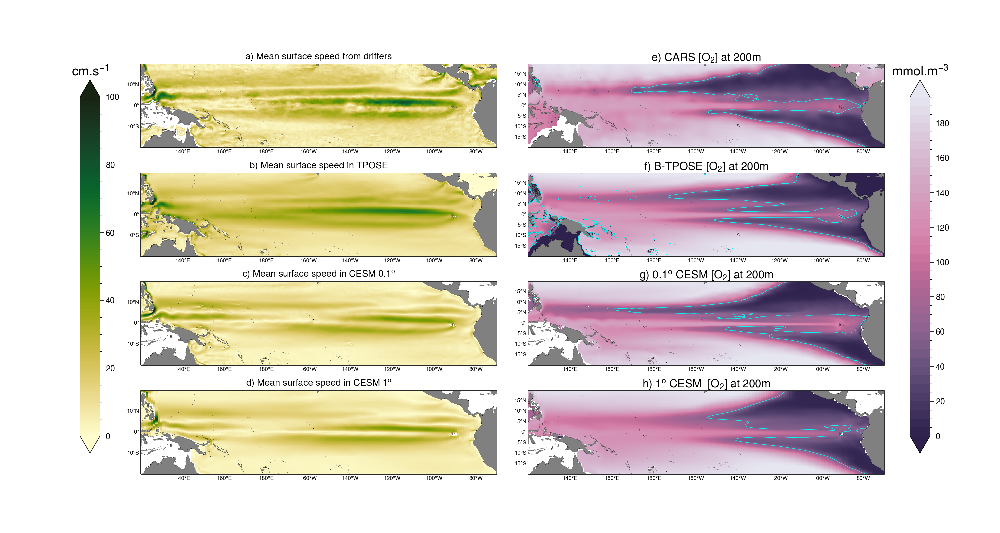

In [165]:
fig = plt.figure(figsize=(15,8),dpi=100)

nr=4; nc=2;  fs=10; fsx=6
E=-180-60; W=-70; S=-20; N=20
coor=[E,W,S,N]; D=1; CL=215.0
lon_lab=[120,140,160,180,-160,-140,-120,-100,-80]
lat_lab=np.arange(S,N,10)
vmn=-100;vmx=100

u_d, ddLonc = util.add_cyclic_point(U_d, coord=dd.Lon)

lonf=[dsu.TLONG,dsl.ULONG,ddLonc,dst.lon]
latf=[dsu.TLAT,dsl.ULAT,dd.Lat,dst.lat]
varf=[u_h.where(mask==2),u_l.where(lmask==2),u_d,u_c]

kl=[12,5,20]; kt=[50,5,5]
lonu=[dsu.ULONG,dsl.ULONG,dd.Lon,
     dsu.ULONG,dsl.ULONG,dd.Lon]
latu=[dsu.ULAT,dsl.ULAT,dd.Lat,
     dsu.ULAT,dsl.ULAT,dd.Lat]
varu=[dsu.UVEL.isel(z_t=0),dsl.UVEL.isel(z_t=0),
      (dd.U*m_cm)]
varv=[dsu.VVEL.isel(z_t=0),dsl.VVEL.isel(z_t=0),
      (dd.V*m_cm)]
pos=[5,7,1,3] 
title=['c) Mean surface speed in CESM 0.1$^{o}$','d) Mean surface speed in CESM 1$^{o}$','a) Mean surface speed from drifters',
      'b) Mean surface speed in TPOSE']

for i in tqdm(np.arange(0,len(varf),1)):
    if i<=3: vmn=0; vmx=100; clr='cmo.speed'; units='cm.s$^{-1}$'
    ax,pc2=plot_map(lonf[i],latf[i], varf[i].squeeze(),vmn, vmx, clr,pos[i],units,title[i],nr,nc,coor,fs,fsx, lon_lab,lat_lab)
#     if i<=1: ii=i; ax=plot_quiver((lonu[i])[::kl[ii],::kt[ii]]-CL,(latu[i])[::kl[ii],::kt[ii]], 
#                                   (varu[i])[::kl[ii],::kt[ii]],(varv[i])[::kl[ii],::kt[ii]],ax)
#     if i==2: ii=i; ax=plot_quiver((lonu[i])[::kl[ii]]-CL,(latu[i])[::kt[ii]], 
#                                   (varu[i])[::kl[ii],::kt[ii]].transpose(),(varv[i])[::kl[ii],::kt[ii]].transpose(),ax)

# fig.subplots_adjust(right=0.95)
# cbar_ax = fig.add_axes([0.90, 0.15, 0.02, 0.7])
# cbar = fig.colorbar(pc, cax=cbar_ax,)
# cbar.ax.set_title('cm.s$^{-1}$',fontsize=14);
# cbar.ax.tick_params(labelsize=12)

#-----------------------
lmax=200
lo = 60.; hi = lo ; dc = 0.1; cnlevels = np.arange(lo, hi+dc, dc)
lo = 5.; hi = lo ; dc = 0.1; cnlevels2 = np.arange(lo, hi+dc, dc)

# Set Depth to plot:
top=100; bot=500; dpt=200

# Set variables for plotting
var=[dsu.O2.isel(time=0).sel(z_t=dpt*1e2,method='nearest').where(mask==2),
     dsl.O2.isel(time=0).sel(z_t=dpt*1e2,method='nearest').where(lmask==2),
     dsc.o2.sel(depth=dpt,method='nearest'),
     dsto.TRAC03.sel(Z=-dpt,method='nearest').mean('time').compute()*1e3]
varc=[dsu.O2.isel(time=0).sel(z_t=dpt*1e2,method='nearest').where(mask==2),
     dsl.O2.isel(time=0).sel(z_t=dpt*1e2,method='nearest').where(lmask==2),
     dsc.o2.sel(depth=dpt,method='nearest'),
     dsto.TRAC03.sel(Z=-dpt,method='nearest').mean('time').compute()*1e3]

long=[dsu.TLONG,dsl.TLONG,dsc.lon, dsto.XC]
lat=[dsu.TLAT,dsl.TLAT,dsc.lat, dsto.YC]
titls=[r'g) 0.1$^o$ CESM [O$_2$] at '+str(dpt)+'m', 
       r'h) 1$^o$ CESM  [O$_2$] at '+str(dpt)+'m',  
       r'e) CARS [O$_2$] at '+str(dpt)+'m',
       r'f) B-TPOSE [O$_2$] at '+str(dpt)+'m']
units='mmol.m$^{-3}$'
pos=[6,8,2,4]

for i in tqdm(range(1,len(var)+1)):
    ax = plt.subplot(nr, nc, pos[i-1], projection=ccrs.PlateCarree(central_longitude=180.0))
    ax.set_extent([E,W,S,N],crs=cartopy.crs.PlateCarree())
    pc= ax.pcolormesh(long[i-1], lat[i-1], var[i-1],vmin=lmax*0, vmax=lmax, cmap='acton',transform=ccrs.PlateCarree()) #, 
    pch= ax.contour(long[i-1], lat[i-1],varc[i-1], colors='cyan', linewidths=0.3, levels=cnlevels,transform=ccrs.PlateCarree())
#     pcs= ax.contour(long[i-1], lat[i-1],varc[i-1], colors='orange', linewidths=0.3, levels=cnlevels2,transform=ccrs.PlateCarree())
    ax.set_title(titls[i-1],pad=0.01,fontsize=fst,loc='center')
    land = ax.add_feature(cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',linewidth=0.1, edgecolor='black', facecolor='grey'))
    ax.tick_params(axis='both', labelsize=fst)
    gl=ax.gridlines(draw_labels=True)
    gl.xlabel_style = {'size': fsx, 'color': 'black'}; gl.ylabel_style = {'size': fsx, 'color': 'black'}; 
    gl.xlabels_top = False; gl.ylabels_right= False; gl.xlines = False; gl.ylines = False
    gl.xlocator = mticker.FixedLocator([140,160,180,-160,-140,-120,-100,-80]); gl.ylocator = mticker.FixedLocator(np.arange(S,N,5))
    gl.xformatter = LONGITUDE_FORMATTER ; gl.yformatter = LATITUDE_FORMATTER
    
fig.subplots_adjust(hspace=0.3,wspace=0.0)
fig.tight_layout()

cbar_ax = fig.add_axes([0.91, 0.15, 0.02, 0.7])
cbar = fig.colorbar(cs, cax=cbar_ax,extend='both')
cbar.ax.set_title('mmol.m$^{-3}$',fontsize=14);

cbar_ax2 = fig.add_axes([0.08, 0.15, 0.02, 0.7])
cbar = fig.colorbar(pc2, cax=cbar_ax2,extend='both')
cbar.ax.set_title('cm.s$^{-1}$',fontsize=14);